In [1]:
# add necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
import cv2
import pandas as pd
import random
import os
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
from imgaug import augmenters as iaa

In [2]:
# : Initialize the  folder name where training image and  driving logs are stored
datadir = 'track'
# :  Initialize the columns names for loading the drive log files
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
# : Read drive log file with specifc columns by using Pandas library
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', None)
# : Display sample data by using 'head' method
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\center_2024_10_29_17_20_07_987.jpg,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\left_2024_10_29_17_20_07_987.jpg,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\right_2024_10_29_17_20_07_987.jpg,0.0,0.0,0.0,0.000079
1,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\center_2024_10_29_17_20_08_088.jpg,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\left_2024_10_29_17_20_08_088.jpg,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\right_2024_10_29_17_20_08_088.jpg,0.0,0.0,0.0,0.000078
2,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\center_2024_10_29_17_20_08_189.jpg,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\left_2024_10_29_17_20_08_189.jpg,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\right_2024_10_29_17_20_08_189.jpg,0.0,0.0,0.0,0.000079
3,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\center_2024_10_29_17_20_08_291.jpg,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\left_2024_10_29_17_20_08_291.jpg,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\right_2024_10_29_17_20_08_291.jpg,0.0,0.0,0.0,0.000078
4,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\center_2024_10_29_17_20_08_393.jpg,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\left_2024_10_29_17_20_08_393.jpg,C:\Users\LENOVO\Downloads\sdcs10\track\IMG\right_2024_10_29_17_20_08_393.jpg,0.0,0.0,0.0,0.000079


In [3]:
def path_leaf(path):
    # : This module provides os.path functionality on Windows platforms.
    # : ntpath.split() gives the file name and folder path
    head, tail = ntpath.split(path)
    return tail

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_10_29_17_20_07_987.jpg,left_2024_10_29_17_20_07_987.jpg,right_2024_10_29_17_20_07_987.jpg,0.0,0.0,0.0,0.000079
1,center_2024_10_29_17_20_08_088.jpg,left_2024_10_29_17_20_08_088.jpg,right_2024_10_29_17_20_08_088.jpg,0.0,0.0,0.0,0.000078
2,center_2024_10_29_17_20_08_189.jpg,left_2024_10_29_17_20_08_189.jpg,right_2024_10_29_17_20_08_189.jpg,0.0,0.0,0.0,0.000079
3,center_2024_10_29_17_20_08_291.jpg,left_2024_10_29_17_20_08_291.jpg,right_2024_10_29_17_20_08_291.jpg,0.0,0.0,0.0,0.000078
4,center_2024_10_29_17_20_08_393.jpg,left_2024_10_29_17_20_08_393.jpg,right_2024_10_29_17_20_08_393.jpg,0.0,0.0,0.0,0.000079


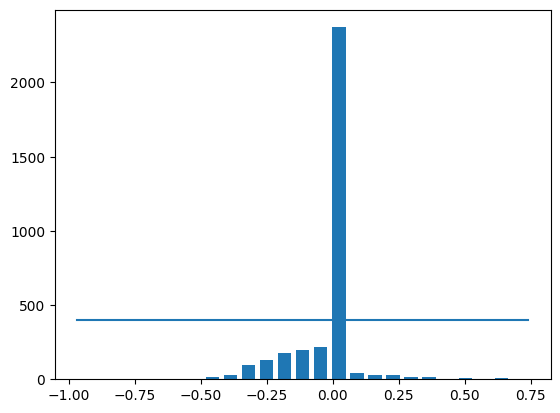

In [4]:
# : Intialize the num_bins, its usually specified as consecutive, non-overlapping intervals of a variable.
# : The edges of the bins. Length nbins + 1
num_bins = 25
# : The max number of the images which will be used for the bin
samples_per_bin = 400

hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

total data: 3391
removed: 1972
remaining: 1419


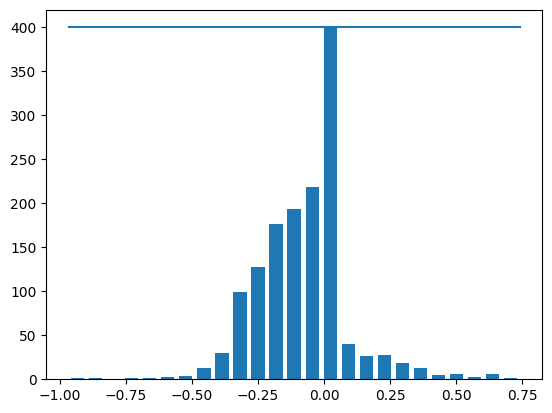

In [5]:
print('total data:', len(data))
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [6]:
print(data.iloc[1])
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
        # left image append
        image_path.append(os.path.join(datadir,left.strip()))
        steering.append(float(indexed_data[3])+0.15)
        # right image append
        image_path.append(os.path.join(datadir,right.strip()))
        steering.append(float(indexed_data[3])-0.15)
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2024_10_29_17_20_08_595.jpg
left          left_2024_10_29_17_20_08_595.jpg
right        right_2024_10_29_17_20_08_595.jpg
steering                                   0.0
throttle                                   0.0
reverse                                    0.0
speed                                 0.000078
Name: 6, dtype: object


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_11340\191718019.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_11340\191718019.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_11340\191718019.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `s

In [7]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3405
Valid Samples: 852


Text(0.5, 1.0, 'Validation set')

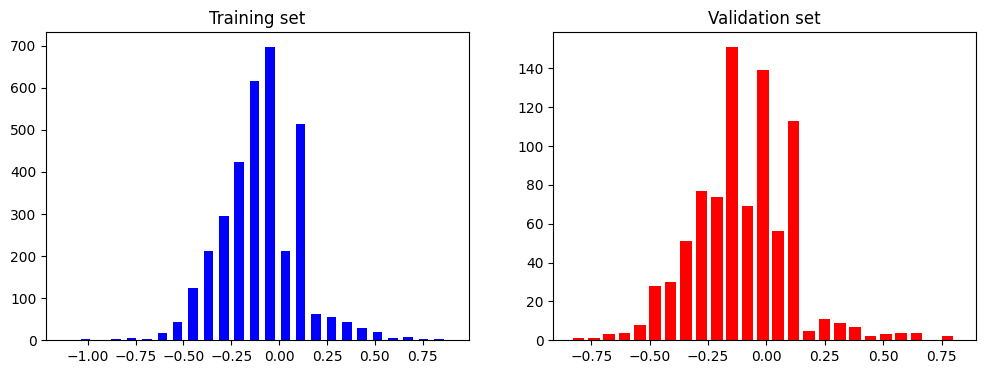

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

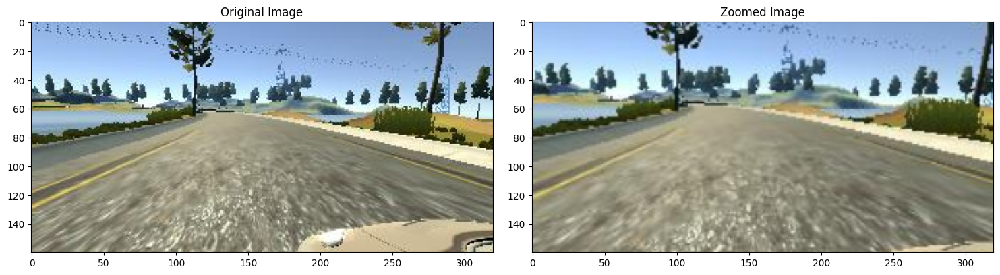

In [9]:
def zoom(image):
    zoom = iaa.Affine(scale=(1,1.3))
    image=zoom.augment_image(image)
    return image
image= image_paths[random.randint(0,1000)]
original_image=mpimg.imread(image)
zoomed_image=zoom(original_image)

fig,axs=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title("Original Image")

axs[1].imshow(zoomed_image)
axs[1].set_title("Zoomed Image")

Text(0.5, 1.0, 'Panned Image')

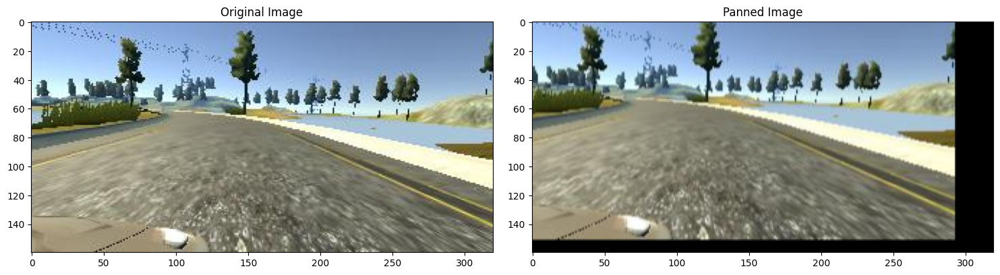

In [10]:
# pan the image
def pan(image):
    pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brithness altered Image')

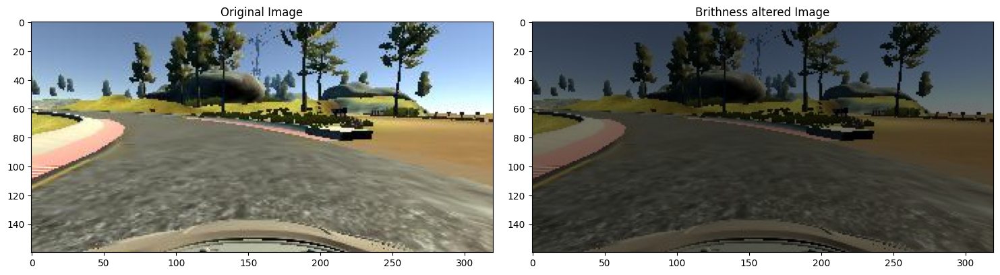

In [11]:
# change brithness of the image
def img_random_brithness(image):
    brithness = iaa.Multiply((0.2,1.2))
    image = brithness.augment_image(image)
    return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brithness_altered_image = img_random_brithness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brithness_altered_image)
axs[1].set_title('Brithness altered Image')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.058377')

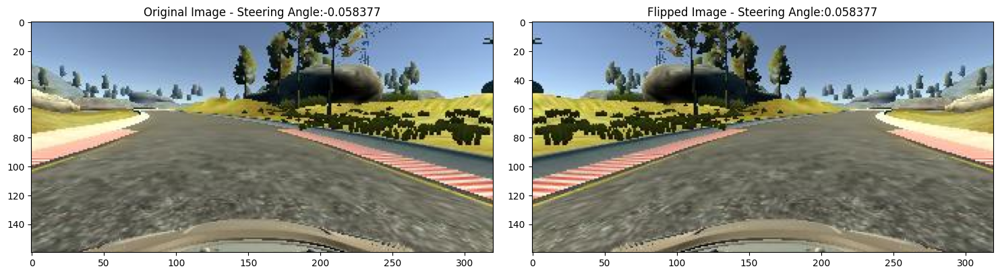

In [12]:
# Flip image horizontally and Vertically

def img_random_flip(image,steering_angle):
    image=cv2.flip(image,1)
    steering_angle=-steering_angle
    return image,steering_angle
random_index=random.randint(0,1000)
image=image_paths[random_index]
steering_angle =steerings[random_index]

original_image=mpimg.imread(image)
flipped_image,flipped_steering_angle= img_random_flip(original_image,steering_angle)

fig,axs=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

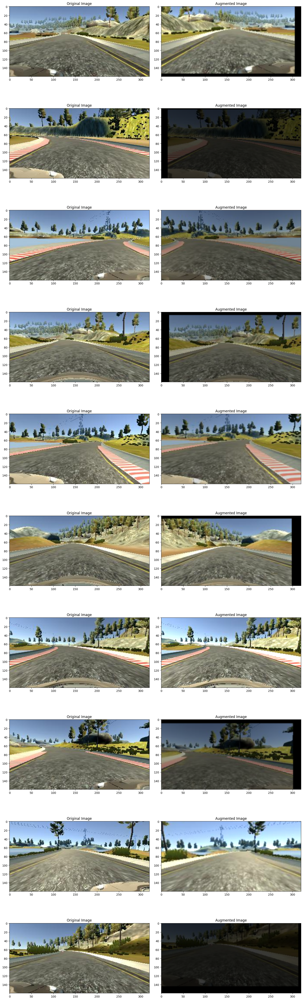

In [13]:
def random_augment(image,steering_angle):
    image=mpimg.imread(image)
    if np.random.rand()<0.5:
        image=pan(image)
    if np.random.rand()<0.5:
        image=zoom(image)
    if np.random.rand()<0.5:
        image=img_random_brithness(image)
    if np.random.rand()<0.5:
        image,steering_angle=img_random_flip(image,steering_angle)

    return image,steering_angle

ncol=2
nrow=10

fig,axs=plt.subplots(nrow,ncol,figsize=(15,50))
fig.tight_layout()

for i in range(10):
    randnum=random.randint(0,len(image_paths)-1)
    random_image=image_paths[randnum]
    random_steering=steerings[randnum]

    original_image=mpimg.imread(random_image)
    augmented_image,steering=random_augment(random_image,random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")


Text(0.5, 1.0, 'Preprocessed Image')

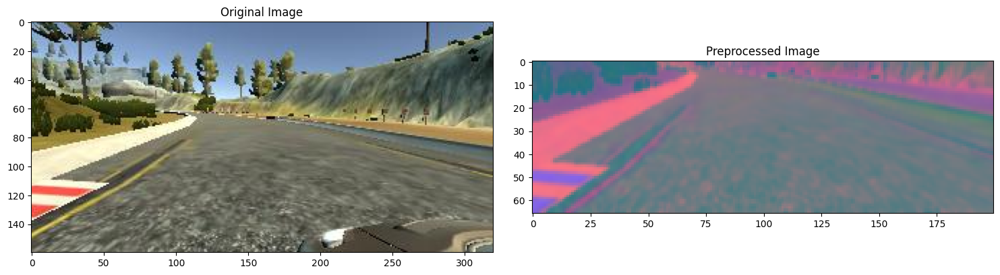

In [14]:
def img_preprocess(img):
    img=img[60:135,:,:]
    img=cv2.cvtColor(img,cv2.COLOR_RGB2YUV)
    img=cv2.GaussianBlur(img,(3,3),0)
    img=cv2.resize(img,(200,66))
    return img

image= image_paths[100]
original_image=mpimg.imread(image)
preprocessed_image= img_preprocess(original_image)

fig,axs=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [15]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

    while True:
        # : Create empty list for batch_img and batch_streeing for each batch processing  
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            # : size-shaped array of random integers from the appropriate distribution, or a single such random int if size not provided.
            random_index = random.randint(0, len(image_paths) - 1)
            # : Check batch-generator is training or testing. 
            # : If it is training it performs random_aumentation method  and get the img and steering angle
            # : else it reads the image paths with random index to get the image  and steering angle
            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]
            # : Perform Image processing techniques for converting a image to YUV color, removing blur and resize the image
            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

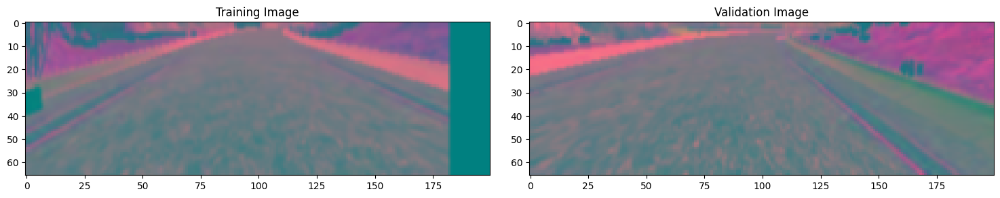

In [16]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [17]:
from keras.models import Sequential
from keras.layers import Conv2D, Flatten, Dense
from keras.optimizers import Adam

def nvidia_model():
    model = Sequential()
    model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))
    # model.add(Dropout(0.5))

    model.add(Flatten())

    model.add(Dense(100, activation='elu'))
    # model.add(Dropout(0.5))

    model.add(Dense(50, activation='elu'))
    # model.add(Dropout(0.5))

    model.add(Dense(10, activation='elu'))
    # model.add(Dropout(0.5))

    model.add(Dense(1))

    optimizer = Adam(learning_rate=1e-3)  
    model.compile(loss='mse', optimizer=optimizer)
    return model


model = nvidia_model()
print(model.summary())


c:\Users\LENOVO\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 31, 98, 24)     │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 47, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 5, 22, 48)      │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 3, 20, 64)      │        27,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 1, 18, 64)      │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │       115,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 252,219 (985.23 KB)

 Trainable params: 252,219 (985.23 KB)

 Non-trainable params: 0 (0.00 B)

None


In [18]:

# train the model
history = model.fit(batch_generator(X_train, y_train, 100, 1),
                              steps_per_epoch=300,
                              epochs=10,
                              validation_data=batch_generator(X_valid, y_valid, 100, 0),
                              validation_steps=200,
                              verbose=1,
                              shuffle = 1)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 317s 1s/step - loss: 2.4964 - val_loss: 0.0292
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 320s 1s/step - loss: 0.0331 - val_loss: 0.0213
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 201s 672ms/step - loss: 0.0288 - val_loss: 0.0228
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 235s 785ms/step - loss: 0.0273 - val_loss: 0.0215
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 230s 769ms/step - loss: 0.0261 - val_loss: 0.0208
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 178s 594ms/step - loss: 0.0255 - val_loss: 0.0206
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 207s 693ms/step - loss: 0.0251 - val_loss: 0.0218
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 182s 608ms/step - loss: 0.0245 - val_loss: 0.0236
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 195s 652ms/step - loss: 0.0251 - val_loss: 0.0214
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 178s 594ms/step - loss: 0.0238 - val_loss: 0.0212


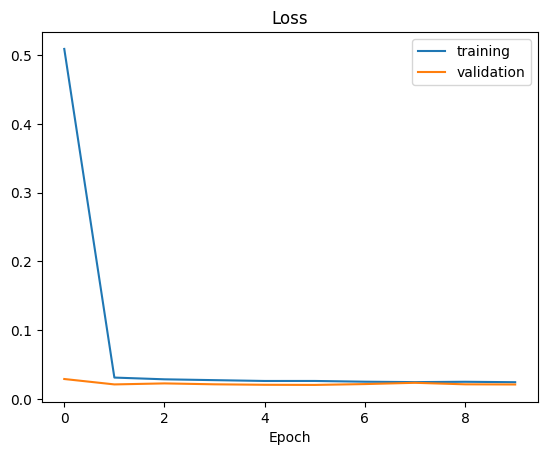

In [19]:
# check the model's training and validation loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')
model.save('model.h5')